In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from skimage.filters import gaussian
from skimage.morphology import binary_erosion, binary_dilation, binary_opening, binary_closing, disk, square
from skimage.feature import canny
from skimage.color import rgb2gray
from skimage.transform import resize

# Read video

In [2]:
VIDEO_FILENAME = "robot_parcours_1.avi"

In [3]:
def read_video(filename):
    frames = []
    
    cap = cv2.VideoCapture(filename)  
    
    while True:
        ret, frame = cap.read()  
        if not ret:
            break # Reached end of video
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        
    cap.release()
    
    return frames

In [4]:
frames = read_video(VIDEO_FILENAME)
len(frames)

42

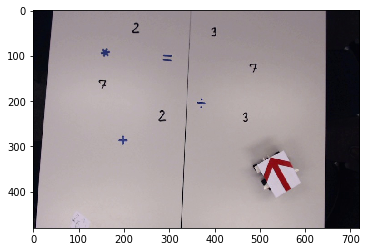

In [5]:
frame = frames[0]

plt.imshow(frame)
plt.show()

# Track robot

Since we know that nothing changes in the scene except of robot position, let's track robot simply by comparing subsequent frames. This approach is usually called object tracking using frame differencing.

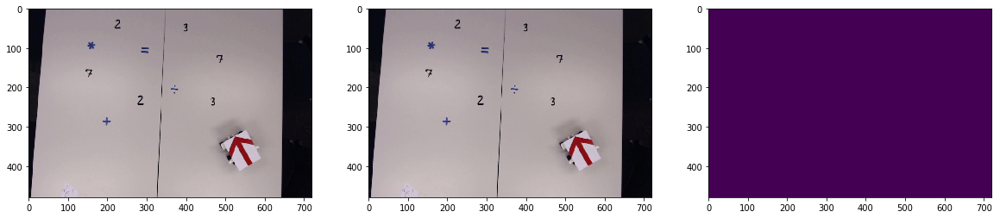

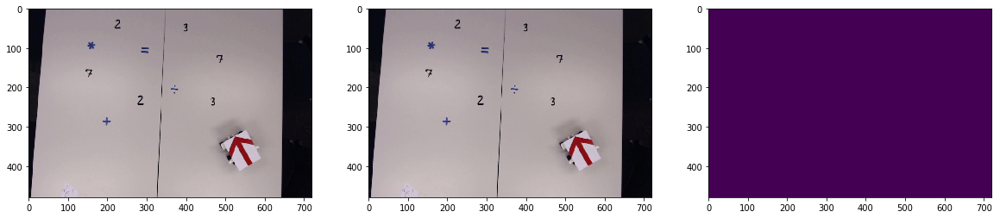

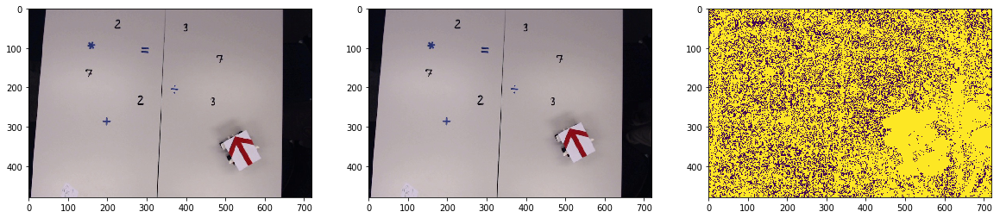

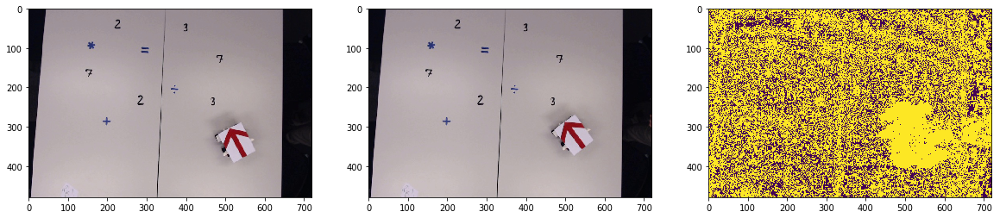

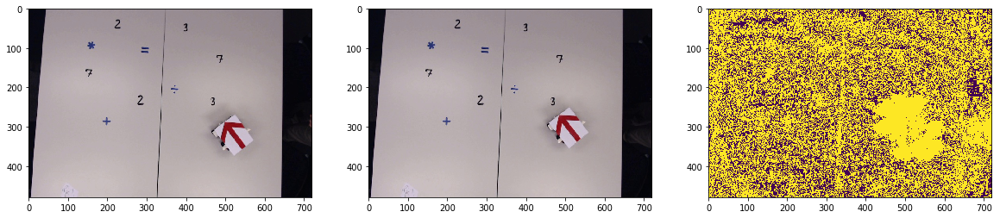

...

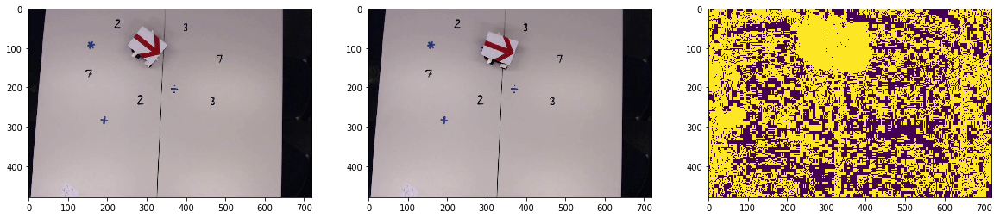

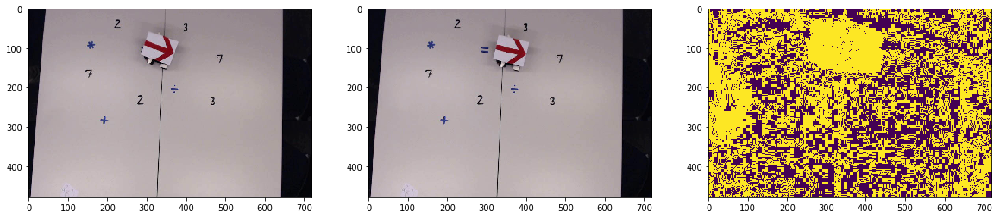

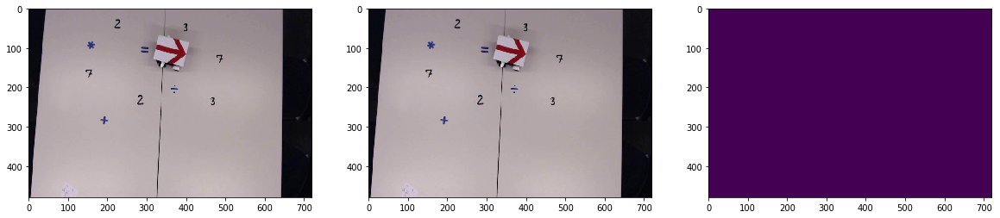

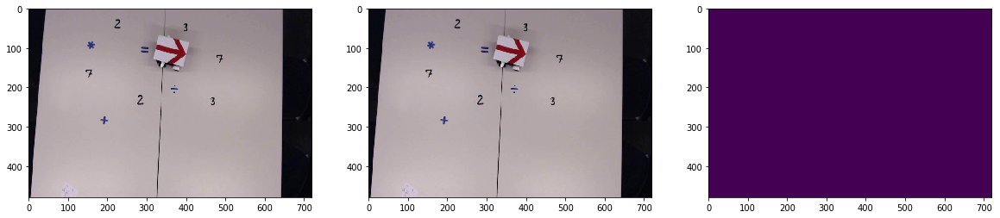

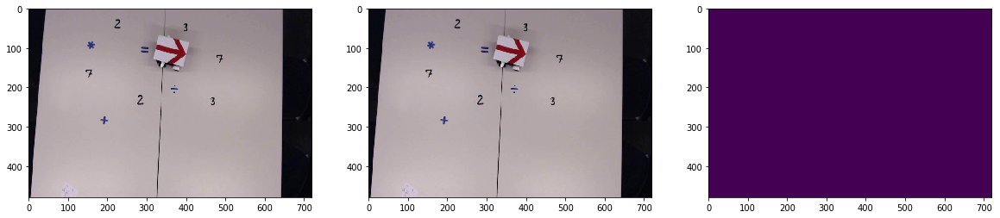

In [6]:
for i in range(1, len(frames)):
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 3, 1)
    frame1 = frames[i - 1]
    plt.imshow(frame1)

    plt.subplot(1, 3, 2)
    frame2 = frames[i]
    plt.imshow(frame2)

    plt.subplot(1, 3, 3)
    changes = (frame1 != frame2)[:, :, 0]
    plt.imshow(changes)
    
    plt.show()

It looks like because of lots of noise this approach will not work. 

Let's blur initial frame images to reduce this moise. Also let's use L2 distance between pixel values.

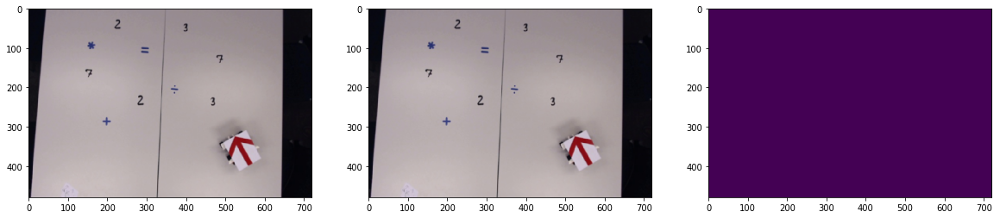

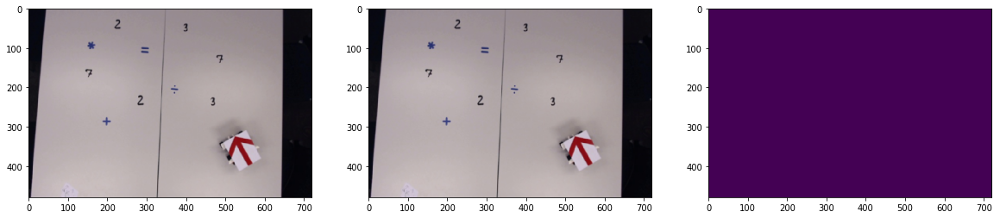

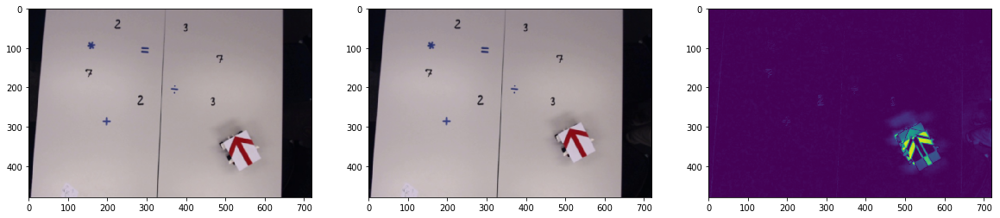

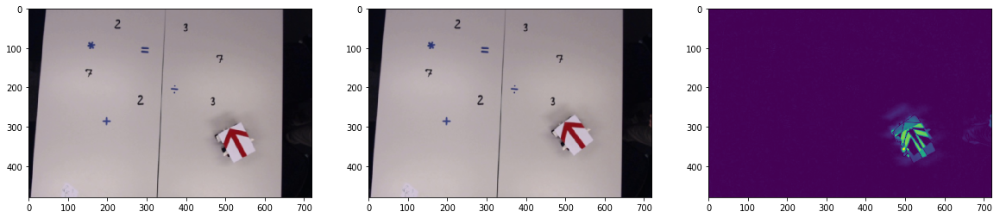

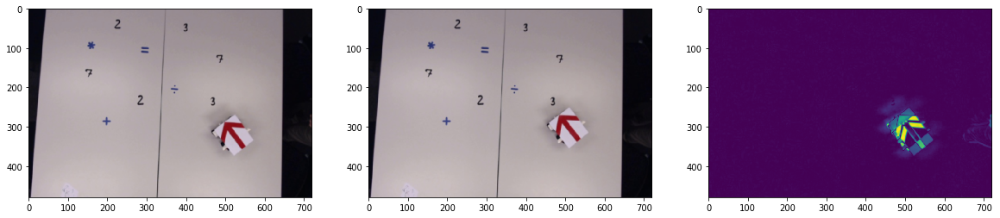

...

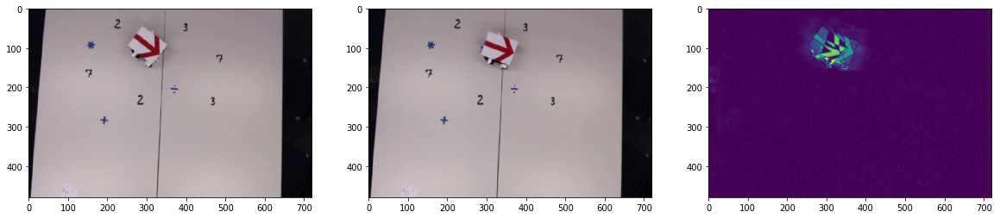

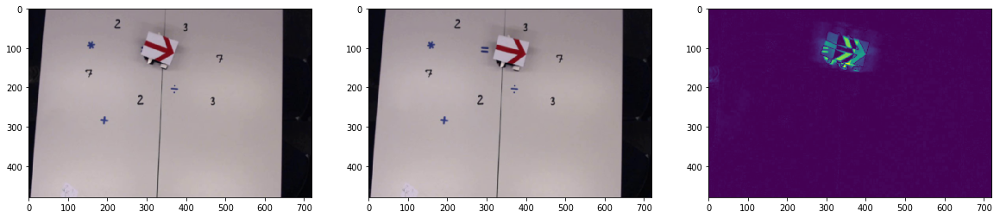

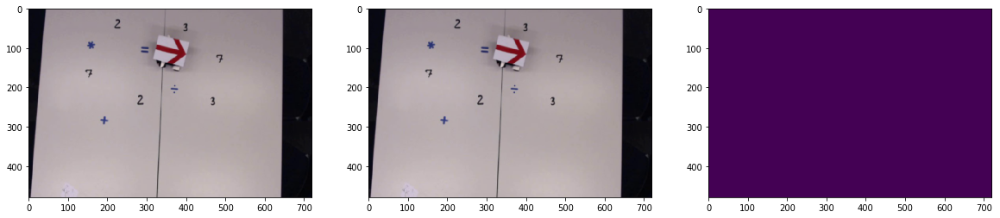

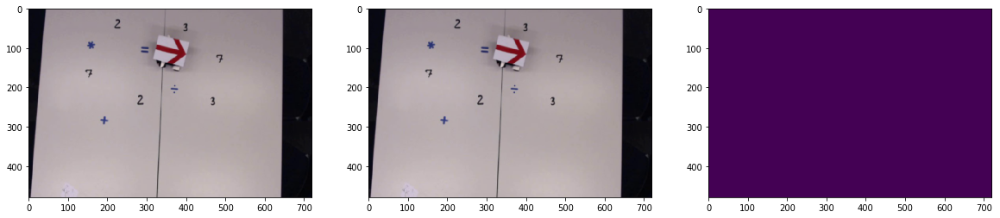

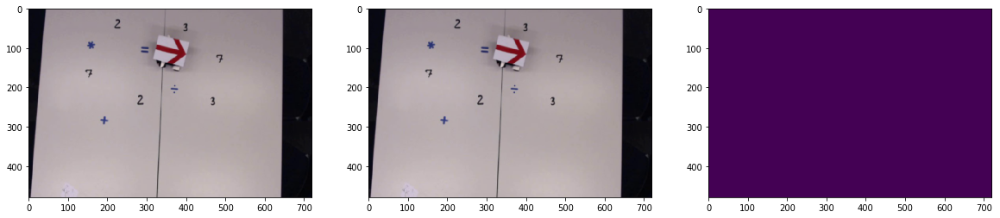

In [7]:
frame_changes = []

for i in range(1, len(frames)):
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 3, 1)
    frame1 = gaussian(frames[i - 1], sigma=1, multichannel=True)
    plt.imshow(frame1)

    plt.subplot(1, 3, 2)
    frame2 = gaussian(frames[i], sigma=1, multichannel=True)
    plt.imshow(frame2)
    
    plt.subplot(1, 3, 3)
    changes = np.linalg.norm(frame1 - frame2, axis=2)
    plt.imshow(changes)
    
    frame_changes.append(changes)
    
    plt.show()

Way better, now by calculating center of changed region we can estimate center of the robot.

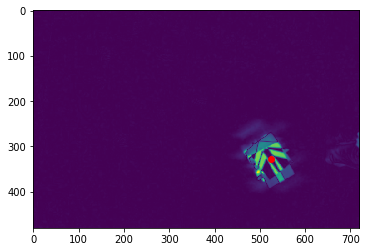

In [8]:
changes = frame_changes[3]

threshold = 0.2
Y, X = np.where(changes > threshold)
X_center = np.mean(X)
Y_center = np.mean(Y)

plt.imshow(changes)
plt.plot(X_center, Y_center, "ro")
plt.show()

In [9]:
def get_robot_positions(changes, threshold = 0.2):
    Y, X = np.where(changes > threshold)
    if len(X) == 0:
        return None
    return np.mean(X), np.mean(Y)

In [10]:
robot_locations = [get_robot_positions(changes) for changes in frame_changes]

For cases when there are no changes in images, let's take as robot position it's position at the previous frames. 

In [11]:
def postprocess_locations(robot_locations):
    if robot_locations[0] is None:
        # Fill initial position
        initial_position = None
        for loc in robot_locations:
            if loc:
                initial_position = loc
                break

        assert(initial_position is not None)
        robot_locations[0] = initial_position
        
    # Fill remaining positions
    last_position = robot_locations[0]
    for i in range(1, len(robot_locations)):
        if robot_locations[i] is None:
            robot_locations[i] = last_position
        else:
            last_position = robot_locations[i]
    return robot_locations

In [12]:
robot_locations = postprocess_locations(robot_locations)

Let's draw calculated trajectory

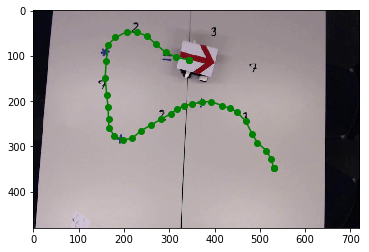

In [13]:
X, Y = list(zip(*robot_locations))
plt.imshow(frames[-1])
plt.plot(X, Y, "g")
plt.plot(X, Y, "go")
plt.show()

Perfect!

In [14]:
def extract_trajectory(frames, change_threshold=0.2):
    # Get differences in frames
    frame_changes = []
    for i in range(1, len(frames)):
        frame1 = gaussian(frames[i - 1], sigma=1, multichannel=True)
        frame2 = gaussian(frames[i], sigma=1, multichannel=True)
        changes = np.linalg.norm(frame1 - frame2, axis=2)
        frame_changes.append(changes)

    # Claculate robot's center
    def get_robot_positions(changes, threshold=0.2):
        Y, X = np.where(changes > threshold)
        if len(X) == 0:
            return None
        return np.mean(X), np.mean(Y)

    robot_locations = [get_robot_positions(changes, threshold=change_threshold) for changes in frame_changes]
    
    # Process case when there are no changes in frames
    def postprocess_locations(robot_locations):
        if robot_locations[0] is None:
            # Fill initial position
            initial_position = None
            for loc in robot_locations:
                if loc:
                    initial_position = loc
                    break

            assert(initial_position is not None)
            robot_locations[0] = initial_position

        # Fill remaining positions
        last_position = robot_locations[0]
        for i in range(1, len(robot_locations)):
            if robot_locations[i] is None:
                robot_locations[i] = last_position
            else:
                last_position = robot_locations[i]
        return robot_locations
    
    trajectory = postprocess_locations(robot_locations)
    
    return trajectory

In [15]:
trajectory = extract_trajectory(frames)

# Create bounding boxes of objects

In [16]:
image = frames[0]

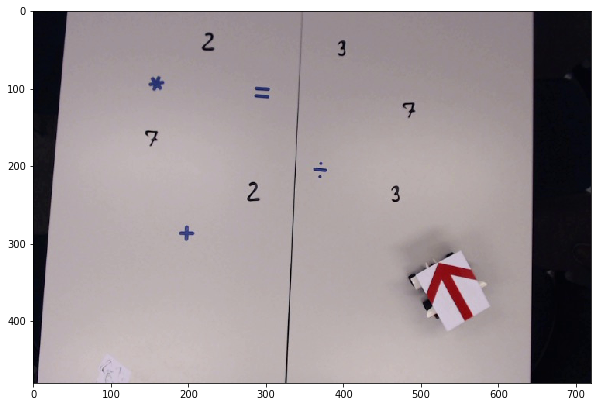

In [17]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.show()

In [18]:
grayscale = rgb2gray(frame) * 255

In [19]:
edges = canny(grayscale/255.) # We will use popular Canny filter for edge detection

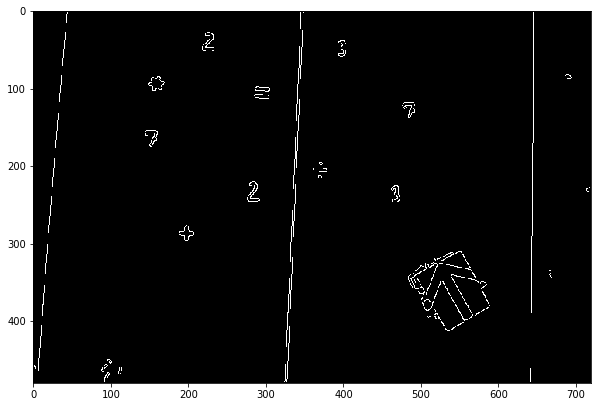

In [20]:
plt.figure(figsize=(10, 10))
plt.imshow(edges, cmap="gray")
plt.show()

In [21]:
square_size = [2, 5, 10, 20]
mask_similarity_threshold = 0.999

shapes_mask = binary_closing(edges, selem=square(square_size[0]))
for size in square_size[1:]:
    new_shapes_mask = binary_closing(edges, selem=square(size))
    if np.sum(new_shapes_mask == shapes_mask) / shapes_mask.size > mask_similarity_threshold:
        print(f"Chose size {size}")
        break
    shapes_mask = new_shapes_mask

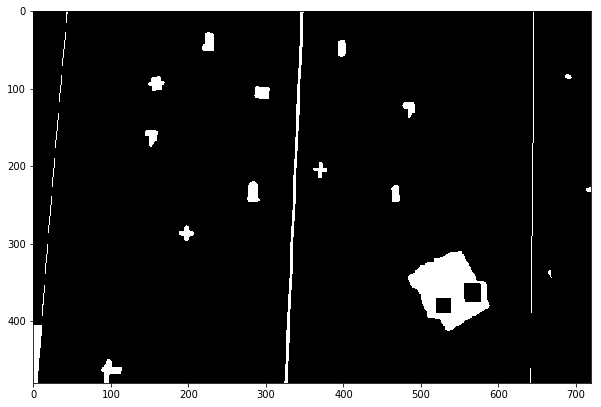

In [22]:
plt.figure(figsize=(10, 10))
plt.imshow(shapes_mask, cmap="gray")
plt.show()

In [23]:
def get_neighbours(pixel):
    """
        Return 4 neighbours of the input pixel.
        
        Parameters
        ----------
        pixel : list of length 2
            The coordinates of the pixel
            
        Returns
        -------
        list of 4 tuples of length 2
            The 4 pixel coordinates of the neighbours.
    """ 
    
    return [(pixel[0] + 1, pixel[1]), 
            (pixel[0] - 1, pixel[1]),
            (pixel[0], pixel[1] + 1),
            (pixel[0], pixel[1] - 1)]

def grow(pixel_to_start, mask, visited):
    
    """
        Return region starting from pixel_to_start. 
        The region should correspond to mask that contain isolated regions of interest.
        
        Parameters
        ----------
        pixel_to_start : list of length 2
            The coordinates of the starting pixel.
        mask : array of shape (image_height, image_width)
            The logical matrix which mark the regions of interest.
        visited : list of lists of length 2
            The list that contains all visited pixels.
            
        Returns
        -------
        list of lists of length 2
            The list of pixels of the grown region.
    """
    
    stack = [pixel_to_start]
    region = [pixel_to_start]
    visited[pixel_to_start] = 1

    while len(stack):
        
        # Pick a pixel
        cur_pixel = stack.pop()

        pixels_to_check = get_neighbours(cur_pixel)
        
        # Delete pixels which are out of image
        pixels_to_check = [pixel for pixel in pixels_to_check 
                           if 0 <= pixel[0] < mask.shape[0] and 0 <= pixel[1] < mask.shape[1]]
        
        # Check if neighbours are not visited and correspond to mask
        pixels_from_region = [pixel for pixel in pixels_to_check if mask[pixel] and not visited[pixel]]
        
        # Update containers
        stack.extend(pixels_from_region)
        for pixel in pixels_from_region:
            visited[pixel] = 1
        region.extend(pixels_from_region)
        
    return region
        
def region_growing(mask):
    
    """
        Region growing method that finds the connected objects 
        in the image indicated by mask and labels them.
        
        Parameters
        ----------
        mask : array of shape (image_height, image_width)
            The logical matrix which mark the regions of interest.
            
        Returns
        -------
        list of lists of lists of length 2
            The list that contains all grown regions.
    """
    
    regions = []
    visited = np.zeros(mask.shape)
    
    while True: # Each iteration is aimed to process one region
        # Search pixels not attached for any processed region
        pixels_to_grow = mask * (1 - visited)
        
        # If all pixels from the mask are labeled, algorithm identified all objects
        if len(pixels_to_grow[pixels_to_grow > 0]) == 0:
            break
            
        X, Y = np.where(pixels_to_grow > 0)
        pixel_to_start = (X[0], Y[0]) # Pixel from unknown region
        
        region = grow(pixel_to_start, mask, visited)
        regions.append(region)
         
    return regions

In [24]:
regions = region_growing(shapes_mask)
print(f"{len(regions)} shapes were found")

53 shapes were found


Let's create bounding boxes for detected objects

In [25]:
regions = [np.array(region) for region in regions]

In [26]:
pad = 2

boxes = [(max(min(region[:, 1]) - pad, 0), 
          max(min(region[:, 0]) - pad, 0),
          min(max(region[:, 1]) + pad, image.shape[1]),
          min(max(region[:, 0]) + pad, image.shape[0])) 
         for region in regions]

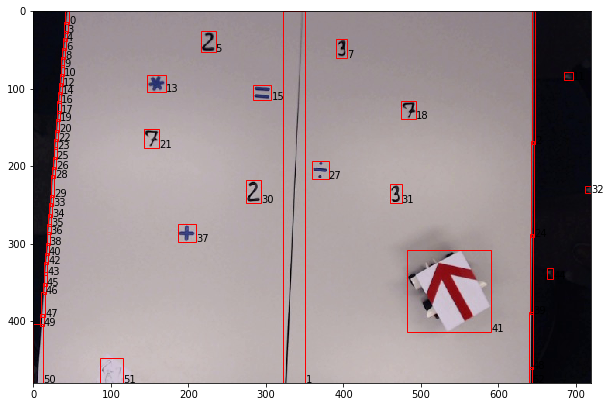

In [27]:
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(frames[0])

for i, box in enumerate(boxes):
    rect = patches.Rectangle(xy=(box[0], box[1]),width=box[2] - box[0], height=box[3]-box[1],
                             linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(rect)
    plt.text(x=box[2], y=box[3], s=str(i))

plt.show()

Looks correct! Now we can extract objects for further recognition. However there is one think we can do to reduce number of wrong detected objects. We know that ration between width and height of our objects is always less than 5, let's then delete detected boxes violating this emperical rule. In particular this trick will help us to remove big object at the middle which is just line on the ground.

In [28]:
boxes_reduced = []
threshold_ratio = 5

for box in boxes:
    width = box[2] - box[0]
    height = box[3] - box[1]
    if width / height < 5 and height / width < 5:
        boxes_reduced.append(box)

In [29]:
print(f"We deleted {len(boxes) - len(boxes_reduced)} objects")

We deleted 9 objects


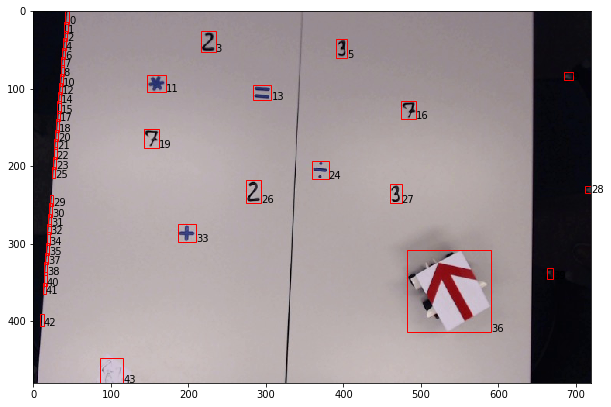

In [37]:
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)

for i, box in enumerate(boxes_reduced):
    rect = patches.Rectangle(xy=(box[0], box[1]),width=box[2] - box[0], height=box[3]-box[1],
                             linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(rect)
    plt.text(x=box[2], y=box[3], s=str(i))

plt.show()

Great, we deleted extra objects while retained needed ones.

In [31]:
objects = [image[box[1]:box[3], box[0]:box[2]] for box in boxes_reduced]

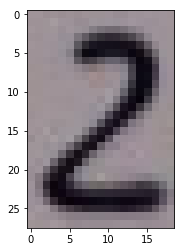

In [32]:
plt.imshow(objects[3])
plt.show()

In [33]:
objects_shape = (28, 28)

objects = [resize(obj, objects_shape) for obj in objects]

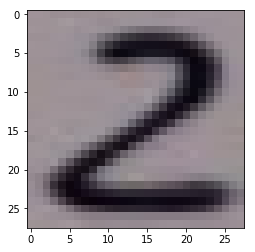

In [34]:
plt.imshow(objects[3])
plt.show()

In [35]:
def extract_objects(image, objects_shape=(28, 28)):
    # Extract edges
    grayscale = rgb2gray(frame) * 255
    edges = canny(grayscale/255.) # We will use popular Canny filter for edge detection
    
    # Fill holes
    square_size = [2, 5, 10, 20]
    mask_similarity_threshold = 0.999
    
    shapes_mask = binary_closing(edges, selem=square(square_size[0]))
    for size in square_size[1:]:
        new_shapes_mask = binary_closing(edges, selem=square(size))
        if np.sum(new_shapes_mask == shapes_mask) / shapes_mask.size > mask_similarity_threshold:
            print(f"Chose size {size}")
            break
        shapes_mask = new_shapes_mask
        
    # Get object regions
    regions = region_growing(shapes_mask)
    regions = [np.array(region) for region in regions]
    
    # Get bounding boxes of objects
    pad = 2
    boxes = [(max(min(region[:, 1]) - pad, 0), 
              max(min(region[:, 0]) - pad, 0),
              min(max(region[:, 1]) + pad, image.shape[1]),
              min(max(region[:, 0]) + pad, image.shape[0])) 
             for region in regions]
    
    # Delete false object detections
    boxes_reduced = []
    threshold_ratio = 5

    for box in boxes:
        width = box[2] - box[0]
        height = box[3] - box[1]
        if width / height < 5 and height / width < 5:
            boxes_reduced.append(box)
        
    # Extract objects from image
    objects = [image[box[1]:box[3], box[0]:box[2]] for box in boxes_reduced]
    
    # Make objects' images to have the same size 
    objects = [resize(obj, objects_shape) for obj in objects]

    return objects

In [36]:
image = frames[0]

objects = extract_objects(image)

# Extracting digits and operations sequence

Let's see wheither trajectory crosses detected objects

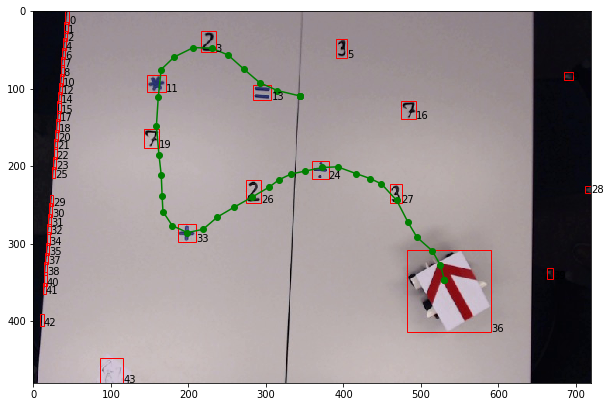

In [39]:
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)

# Plot trajectory
X, Y = list(zip(*robot_locations))
plt.plot(X, Y, "g")
plt.plot(X, Y, "go")

# Plot detected objects
for i, box in enumerate(boxes_reduced):
    rect = patches.Rectangle(xy=(box[0], box[1]),width=box[2] - box[0], height=box[3]-box[1],
                             linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(rect)
    plt.text(x=box[2], y=box[3], s=str(i))

plt.show()

Some observations:
* Trajectory line crosses needed objects
* There are crossed objects which don't have trajectory points inside their boundary box

We have different ways to process such data:
* We can increase size of bounding boxes since needed objects always are far enough from each other.
* We can try to detect intersections of trajectory line with objects' bounding boxes

# Digits and operations recognition

# Calculating expression

# Creating output video